<a href="https://colab.research.google.com/github/adhityan924/SEM/blob/main/GutHealthAlzeimerPrototype.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install cellxgene-census
!pip install scanpy
!pip install pandas_profiling
!pip install pydantic-settings
!pip install ydata-profiling
!pip install jupyter-contrib-nbextensions
!pip install scikit-learn
!pip install igraph
!pip install scvi-tools
!pip install scikit-misc
!pip install leidenalg

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.8/54.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.0/129.0 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/77.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 kB 3.5 MB/s eta 0:00:00
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8023 sha256=2

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pandas as pd
from sklearn.decomposition import IncrementalPCA
import requests
import json
import urllib

urllib.request.urlretrieve('https://datasets.cellxgene.cziscience.com/fadec542-5680-4cd0-aee1-dbcdecf5b4a1.h5ad', 'gastritis_data_dataset.h5ad')
urllib.request.urlretrieve('https://datasets.cellxgene.cziscience.com/5d871206-9489-4d9f-8106-94305ccb1c3a.h5ad', 'alzheimer_data_dataset.h5ad')

gastritis_data = sc.read_h5ad("gastritis_data_dataset.h5ad")
alzheimer_data = sc.read_h5ad("alzheimer_data_dataset.h5ad")

In [9]:
# Set up plotting
sc.settings.set_figure_params(dpi=100, facecolor='white')
%matplotlib inline

# Function to load and preprocess data
def load_and_preprocess(file_path, name):
    print(f"Loading and preprocessing {name} dataset...")
    adata = sc.read_h5ad(file_path)

    print(f"{name} dataset shape: {adata.shape}")

    # Basic preprocessing
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)

    adata.var['mt'] = adata.var_names.str.startswith('MT-')
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

    # Plot QC metrics
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
                 jitter=0.4, multi_panel=True)
    plt.suptitle(f"{name} - QC Metrics")
    plt.tight_layout()
    plt.show()

    # Further filtering
    adata = adata[adata.obs.n_genes_by_counts < 2500, :]
    adata = adata[adata.obs.pct_counts_mt < 5, :]

    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

    adata = adata[:, adata.var.highly_variable]
    sc.pp.scale(adata, max_value=10)

    return adata

In [10]:
# Function for basic analysis
def analyze_dataset(adata, name):
    print(f"\nAnalyzing {name} dataset...")

    sc.tl.pca(adata, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=True)

    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
    sc.tl.umap(adata)
    sc.tl.leiden(adata)

    sc.pl.umap(adata, color=['leiden', 'cell_type'] if 'cell_type' in adata.obs.columns else ['leiden'])
    plt.suptitle(f"{name} - UMAP")
    plt.show()

    sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
    plt.suptitle(f"{name} - Top Differentially Expressed Genes")
    plt.show()


Analyzing Alzheimer's dataset...


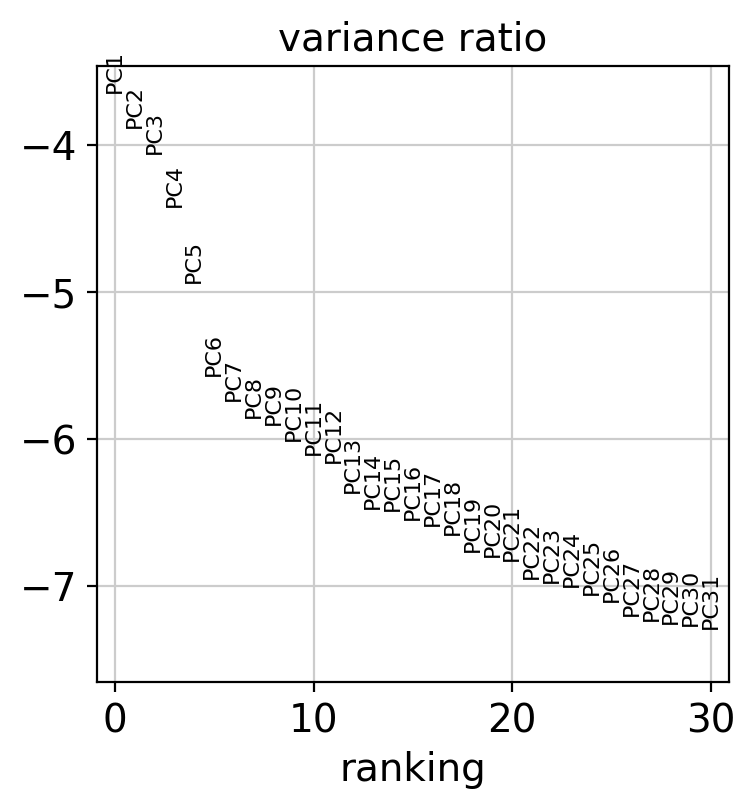

<ipython-input-10-393e0d68a79f>:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)


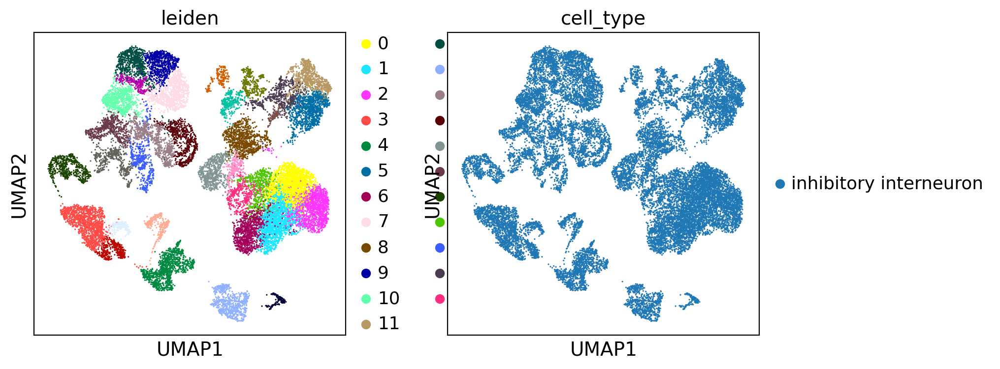

<Figure size 400x400 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:440: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

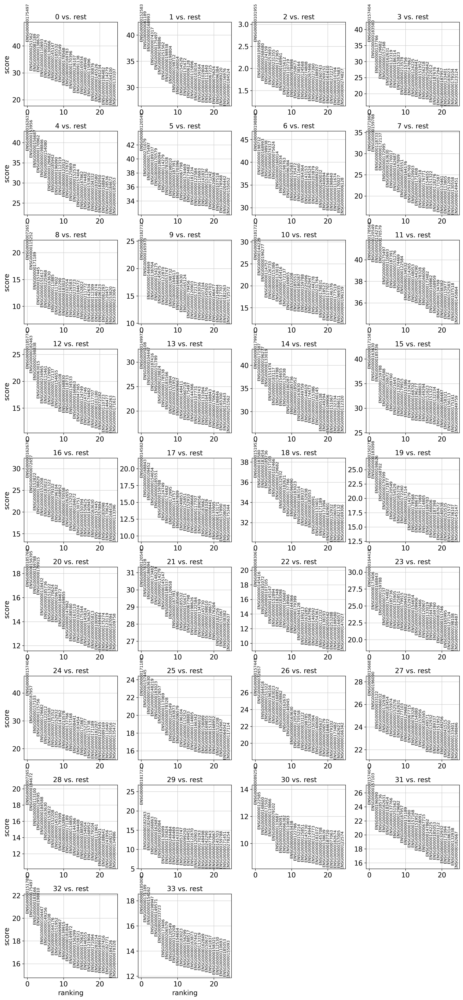

<Figure size 400x400 with 0 Axes>


Analyzing Gastritis dataset...


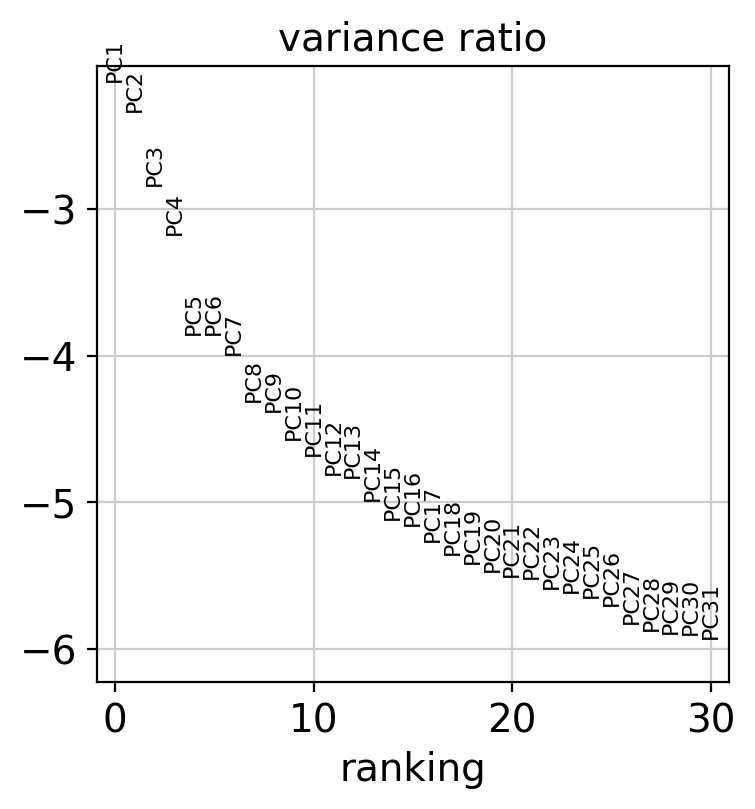

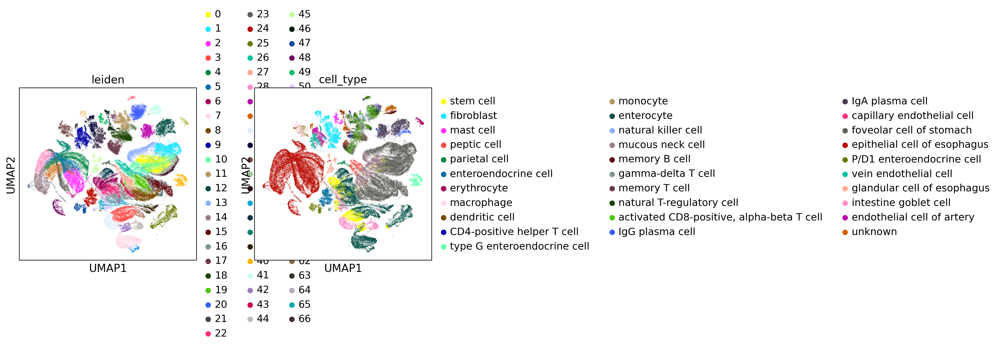

<Figure size 400x400 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:458: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:435: Perfo

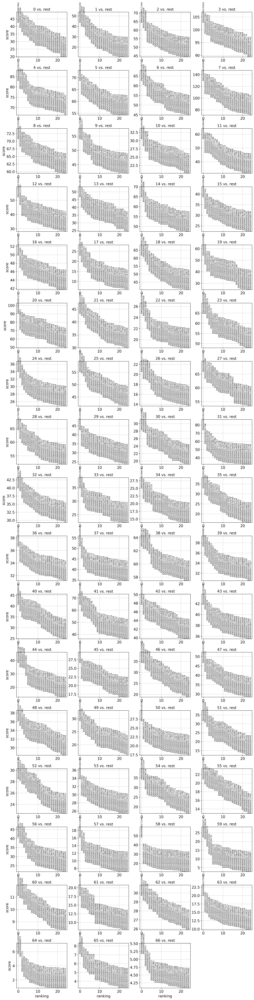

<Figure size 400x400 with 0 Axes>

In [11]:
# Analyze both datasets
analyze_dataset(alzheimer_data, "Alzheimer's")
analyze_dataset(gastritis_data, "Gastritis")

In [1]:
# Compare common genes
common_genes = list(set(alzheimer_data.var_names) & set(gastritis_data.var_names))
print(f"Number of common genes: {len(common_genes)}")

alzheimer_expr = alzheimer_data[:, common_genes].X.mean(axis=0)
gastritis_expr = gastritis_data[:, common_genes].X.mean(axis=0)

if scipy.sparse.issparse(alzheimer_expr):
    alzheimer_expr = alzheimer_expr.A.flatten()
if scipy.sparse.issparse(gastritis_expr):
    gastritis_expr = gastritis_expr.A.flatten()

plt.figure(figsize=(10, 10))
plt.scatter(alzheimer_expr, gastritis_expr, alpha=0.5)
plt.xlabel("Alzheimer's Gene Expression")
plt.ylabel("Gastritis Gene Expression")
plt.title("Comparison of Gene Expression")
plt.show()

NameError: name 'alzheimer_data' is not defined

In [2]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns


print("Preprocessing data...")
# Preprocess the data
sc.pp.normalize_total(gastritis_data, target_sum=1e4)
sc.pp.normalize_total(alzheimer_data, target_sum=1e4)
sc.pp.log1p(gastritis_data)
sc.pp.log1p(alzheimer_data)

# Perform feature selection
sc.pp.highly_variable_genes(gastritis_data, n_top_genes=2000)
sc.pp.highly_variable_genes(alzheimer_data, n_top_genes=2000)

Preprocessing data...


In [ ]:
print("Standardizing data...")
# Standardize the data separately for each dataset
scaler_gastritis = StandardScaler(with_mean=False)  # Use with_mean=False for sparse data
scaler_alzheimer = StandardScaler(with_mean=False)
gastritis_scaled = scaler_gastritis.fit_transform(gastritis_data.X)
alzheimer_scaled = scaler_alzheimer.fit_transform(alzheimer_data.X)

print("Performing PCA...")
# Perform PCA separately for each dataset
pca_gastritis = PCA(n_components=50)
pca_alzheimer = PCA(n_components=50)
gastritis_pca = pca_gastritis.fit_transform(gastritis_scaled.toarray() if scipy.sparse.issparse(gastritis_scaled) else gastritis_scaled)
alzheimer_pca = pca_alzheimer.fit_transform(alzheimer_scaled.toarray() if scipy.sparse.issparse(alzheimer_scaled) else alzheimer_scaled)

print("Visualizing PCA results...")
# Visualize PCA results
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.scatter(gastritis_pca[:, 0], gastritis_pca[:, 1], alpha=0.5)
plt.title("Gastritis PCA")
plt.subplot(122)
plt.scatter(alzheimer_pca[:, 0], alzheimer_pca[:, 1], alpha=0.5)
plt.title("Alzheimer's PCA")
plt.show()

print("Comparing gene expression...")
# Check for missing or empty gene names
def check_missing_genes(var_names):
    return [i for i, gene in enumerate(var_names) if not gene]

missing_genes_gastritis = check_missing_genes(gastritis_data.var_names)
missing_genes_alzheimer = check_missing_genes(alzheimer_data.var_names)

print(f"Missing genes in gastritis dataset: {len(missing_genes_gastritis)}")
print(f"Missing genes in Alzheimer's dataset: {len(missing_genes_alzheimer)}")

# Remove missing or empty gene names
if missing_genes_gastritis:
    gastritis_data.var_names = [gene for i, gene in enumerate(gastritis_data.var_names) if i not in missing_genes_gastritis]
if missing_genes_alzheimer:
    alzheimer_data.var_names = [gene for i, gene in enumerate(alzheimer_data.var_names) if i not in missing_genes_alzheimer]

# Identify common genes
common_genes = list(set(gastritis_data.var_names) & set(alzheimer_data.var_names))

if not common_genes:
    print("No common genes found between the datasets.")
else:
    print(f"Number of common genes: {len(common_genes)}")

    # Compare gene expression
    try:
        gastritis_expr = gastritis_data[:, common_genes].X.mean(axis=0)
        alzheimer_expr = alzheimer_data[:, common_genes].X.mean(axis=0)

        # Convert to dense arrays if sparse
        if scipy.sparse.issparse(gastritis_expr):
            gastritis_expr = gastritis_expr.toarray().flatten()
        if scipy.sparse.issparse(alzheimer_expr):
            alzheimer_expr = alzheimer_expr.toarray().flatten()

        plt.figure(figsize=(10, 10))
        plt.scatter(gastritis_expr, alzheimer_expr, alpha=0.5)
        plt.xlabel("Gastritis Gene Expression")
        plt.ylabel("Alzheimer's Gene Expression")
        plt.title("Gene Expression Comparison")
        plt.show()
    except Exception as e:
        print(f"An error occurred while comparing gene expression: {str(e)}")

print("Performing differential expression analysis...")
# Perform differential expression analysis
if 'cell_type' in gastritis_data.obs.columns:
    sc.tl.rank_genes_groups(gastritis_data, 'cell_type', method='wilcoxon')
    print("Gastritis differential expression analysis complete.")
else:
    print("Warning: 'cell_type' not found in gastritis data. Skipping differential expression analysis.")

if 'cell_type' in alzheimer_data.obs.columns:
    sc.tl.rank_genes_groups(alzheimer_data, 'cell_type', method='wilcoxon')
    print("Alzheimer's differential expression analysis complete.")
else:
    print("Warning: 'cell_type' not found in Alzheimer's data. Skipping differential expression analysis.")

print("Training classifier...")
# Train a classifier
X = np.concatenate([gastritis_pca, alzheimer_pca])
y = np.concatenate([np.zeros(gastritis_data.n_obs), np.ones(alzheimer_data.n_obs)])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

print("Visualizing feature importance...")
# Feature importance
feature_importance = pd.DataFrame({'feature': [f'PC_{i}' for i in range(50)], 'importance': clf.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False).head(20)

plt.figure(figsize=(10, 8))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title("Top 20 Important Principal Components")
plt.show()

print("Analysis complete.")